<a href="https://colab.research.google.com/github/Ziqi-Li/GEOG5018-Principles-of-Carto/blob/main/Geovisualisation_in_Python.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Geovisualisation in Python


In this lab, you will be learning how to create statistical thematic maps using python in a **reproducible** manner.


### Loading libraries

In this lab, we will be mainly using two python libriries:

 - `geopandas` is a library to process and handle geo tabular data. It is able to read/write common GIS files (e.g. shapefile, geojson), perform geoprocessing (e.g. calculating centroids, creating buffers, re-projecting data), and manipulate data attributes (e.g. joining tables, creating a new field). `geopandas` is a must-have/must-learn tool for a geospatial data scientist.
 
 
 - `plotly` is a library generally for interactive data visualisation but has capability to visulise GIS data and provides high-level interactity.

For packages that are not pre-loaded into Google Colab, we can install it by running `!pip install package`. However, this installation only applies to the current runtime, so you may have to re-run the installation everytime when you reload your notebook on Colab. Remove the `#` and run the cell.

In [54]:
#!pip install geopandas
#!pip install mapclassify

In [55]:
import geopandas

Importing and Writing data using `geopandas.read_file("path to your data")` and `geopandas.to_file("path and name for your output")` For example: we can read in the Dumfries data as:

In [56]:
Dumfries = geopandas.read_file("Dumfries_lcs_2011.shp")

The GIS file will be stored in the variable `Dumfries`, which is called a `GeoDataFrame` object.

In [57]:
type(Dumfries)

geopandas.geodataframe.GeoDataFrame

Check the first 5 rows in the data

In [58]:
Dumfries.head()

,name,code,aother,osector,label,geometry
0,DG9 8,S29000183,NO,None,DG9 8,"POLYGON ((207940.687 562438.533, 207984.600 56..."
1,DG2 9,S29000167,NO,None,DG2 9,"POLYGON ((282724.001 579690.000, 282701.000 57..."
2,DG3 5,S29000169,NO,None,DG3 5,"POLYGON ((287603.000 595808.000, 287568.000 59..."
3,DG1 1,S29000151,NO,None,DG1 1,"MULTIPOLYGON (((298897.536 579818.395, 298896...."
4,DG1 2,S29000152,NO,None,DG1 2,"POLYGON ((297118.279 575860.156, 297084.399 57..."


Check the shape of the data: 34 rows and 6 columns

In [59]:
Dumfries.shape

(34, 6)

Check the coordinate reference system (crs)

In [60]:
Dumfries.crs

<Projected CRS: EPSG:27700>
Name: OSGB36 / British National Grid
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: United Kingdom (UK) - offshore to boundary of UKCS within 49°45'N to 61°N and 9°W to 2°E; onshore Great Britain (England, Wales and Scotland). Isle of Man onshore.
- bounds: (-9.0, 49.75, 2.01, 61.01)
Coordinate Operation:
- name: British National Grid
- method: Transverse Mercator
Datum: Ordnance Survey of Great Britain 1936
- Ellipsoid: Airy 1830
- Prime Meridian: Greenwich

Plot the data:

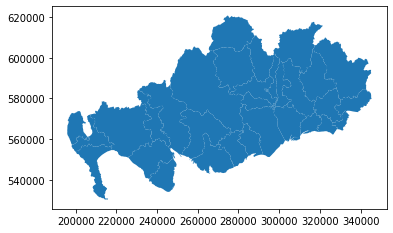

In [61]:
Dumfries.plot()

Next, we need to read the csv table and join the table with the shapefile

In [62]:
import pandas
Dum_stats = pandas.read_csv("DG LC PCSectordata.csv")

In [63]:
Dum_stats.head()

,PC Sector,Persons,Hectares,Persons per hectare
0,DG1 1,5971,6427.0,0.93
1,DG1 2,2593,86.0,30.02
2,DG1 3,7005,9346.0,0.75
3,DG1 4,11005,12574.0,0.88
4,DG10 9,3962,31409.0,0.13


The common key is `name` in the `Dumfries` `GeoDataFrame`, and `PC Sector` in the `Dum_stats` table.

In [64]:
Dumfries_merged = Dumfries.merge(Dum_stats,left_on="name", right_on="PC Sector")

In [65]:
Dumfries_merged.head()

,name,code,aother,osector,label,geometry,PC Sector,Persons,Hectares,Persons per hectare
0,DG9 8,S29000183,NO,None,DG9 8,"POLYGON ((207940.687 562438.533, 207984.600 56...",DG9 8,3820,11397.0,0.34
1,DG2 9,S29000167,NO,None,DG2 9,"POLYGON ((282724.001 579690.000, 282701.000 57...",DG2 9,7768,7162.0,1.08
2,DG3 5,S29000169,NO,None,DG3 5,"POLYGON ((287603.000 595808.000, 287568.000 59...",DG3 5,2571,16524.0,0.16
3,DG1 1,S29000151,NO,None,DG1 1,"MULTIPOLYGON (((298897.536 579818.395, 298896....",DG1 1,5971,6427.0,0.93
4,DG1 2,S29000152,NO,None,DG1 2,"POLYGON ((297118.279 575860.156, 297084.399 57...",DG1 2,2593,86.0,30.02


We can check the distribution of any column by creating a histogram.

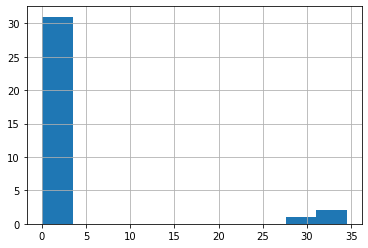

In [66]:
Dumfries_merged['Persons per hectare'].hist()

### Choropleth map

A simple choropleth map with a natrual breaks classification for the column `Persons per hectare`.

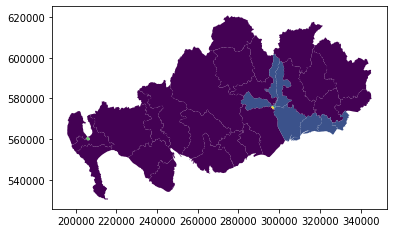

In [67]:
Dumfries_merged.plot(column="Persons per hectare", scheme="NaturalBreaks")

There are many parameters in the plot you can tweak, see the full documentation here: 

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.plot.html

The colour keywords can be found here:

https://matplotlib.org/stable/gallery/color/colormap_reference.html


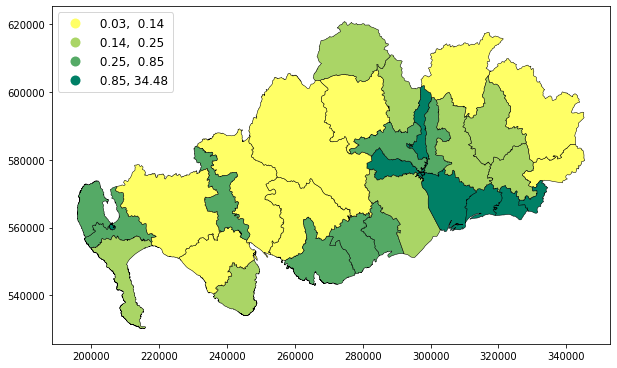

In [68]:
Dumfries_merged.plot(column="Persons per hectare", #Column
                     scheme="Quantiles", #classification
                     k=4, #number of classes
                     legend=True,
                     cmap="summer_r", #color ramp: https://matplotlib.org/stable/gallery/color/colormap_reference.html
                     figsize=(10,10), #figure size
                     alpha = 1, # transparency
                     linewidth=0.5, #border width
                     edgecolor='black', #border colour 
                     legend_kwds = {'loc':2,'fontsize':'large'} #Extra legend parameters
                     #There are 11 positions for legend 0 - 10
                    )


In [69]:
import matplotlib.pyplot as plt

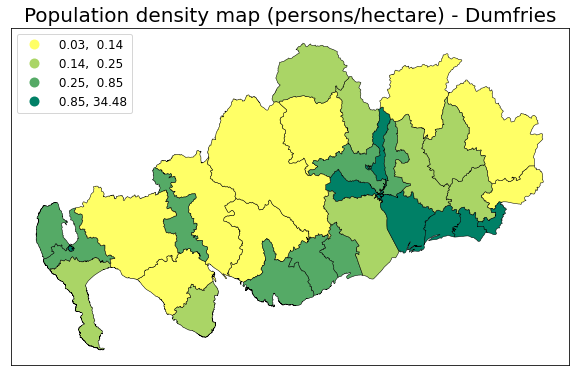

In [70]:
Dumfries_merged.plot(column="Persons per hectare", #Column
                     scheme="Quantiles", #classification
                     k=4, #number of classes
                     legend=True,
                     cmap="summer_r", #color ramp: https://matplotlib.org/stable/gallery/color/colormap_reference.html
                     figsize=(10,10), #figure size
                     alpha = 1, # transparency
                     linewidth=0.5, #border width
                     edgecolor='black', #border colour 
                     legend_kwds = {'loc':2,'fontsize':'large'} #Extra legend parameters
                     #There are 11 positions for legend 0 - 10
                    )
plt.title("Population density map (persons/hectare) - Dumfries",fontsize = 20)


#You can remove the grid or the box using code below:
plt.xticks([]) #remove grid ticks
plt.yticks([]) #remove grid ticks
#plt.box() #remove the box

#You can save the plot as an image with a dpi (resolution)
plt.savefig("dum_map.png",dpi=300) # save it locally

### Overlaying two layers

When you have two layers, you may want to overlay them together. For example, you have a layer with the centroids, and this can be easily computed using the `.centroid()` function.

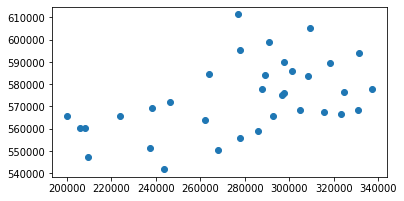

In [71]:
Dumfries_merged.centroid.plot()

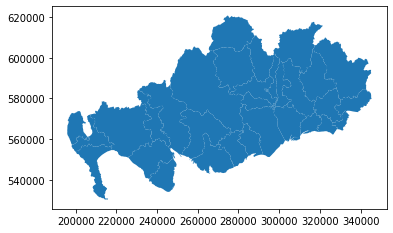

In [72]:
Dumfries_merged.plot()

The method here is to generate an axis in `matplotlib`. Then plot two layers onto the same axis. You would need to pass the axis to the `ax` parameter in the `plot()` function as `plot(ax=ax)`.

The centroids can have the size which is proportional to the population value. There is a scale factor of 2 that I applied as the denominator which you can tweak to scale the marker size.

([], <a list of 0 Text major ticklabel objects>)

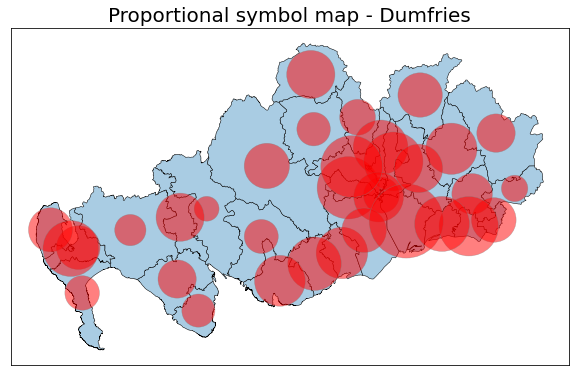

In [73]:
fig, ax = plt.subplots(figsize=(10,10))

#Layer 1
Dumfries_merged.plot(ax=ax,color='#A9CCE3',linewidth=0.5,edgecolor='black')

#Layer 2
Dumfries_merged.centroid.plot(ax=ax, #Plot to the axis
                              markersize=Dumfries_merged["Persons"]/2, #Make the marker size proportional to the value
                              color='red', #color for the circle
                              edgecolor='grey', linewidth=0.5,
                              alpha=0.5,
                    )

plt.title("Proportional symbol map - Dumfries",fontsize = 20)

plt.xticks([]) #remove grid ticks
plt.yticks([]) #remove grid ticks
#plt.box() #remove the box
#plt.savefig("dum_proportional.png",dpi=300) # save it locally

Unfortunately, there is no easy way (at the moment) to create a legend for point symbol maps in python.

### Create a layout with multiple plots.

Sometimes we want to organise multiple plots in the same layout.

This can be done by creating a `plt.subplots` with the layout, say 2 by 2, which will generate 4 axes that you can place each map. You may need to enlarge the figuresize to allow the space for each figure.

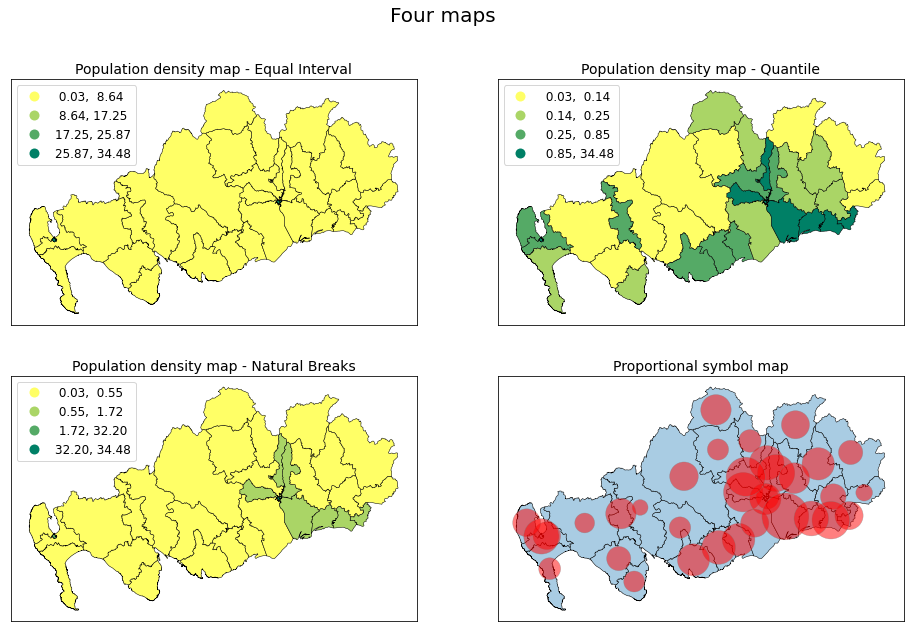

In [41]:
#############Overall layout############
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2,figsize=(16,10))
fig.suptitle('Four maps',fontsize=20)


#############The first map############
Dumfries_merged.plot(ax = ax1, #axis 1 
                     column="Persons per hectare", #Column
                     scheme="EqualInterval", #classification
                     k=4, #number of classes
                     legend=True,
                     cmap="summer_r", #color ramp: https://matplotlib.org/stable/gallery/color/colormap_reference.html
                     figsize=(10,10), #figure size
                     alpha = 1, # transparency
                     linewidth=0.5, #border width
                     edgecolor='black', #border colour 
                     legend_kwds = {'loc':2,'fontsize':'large'} #Extra legend parameters
                     #There are 11 positions for legend 0 - 10
                    )
ax1.set_title("Population density map - Equal Interval",fontsize = 14)

ax1.set_xticks([]) #remove grid ticks
ax1.set_yticks([]) #remove grid ticks
      
      
#############The second map############
Dumfries_merged.plot(ax = ax2, #axis 2
                     column="Persons per hectare", #Column
                     scheme="Quantiles", #classification
                     k=4, #number of classes
                     legend=True,
                     cmap="summer_r", #color ramp: https://matplotlib.org/stable/gallery/color/colormap_reference.html
                     figsize=(10,10), #figure size
                     alpha = 1, # transparency
                     linewidth=0.5, #border width
                     edgecolor='black', #border colour 
                     legend_kwds = {'loc':2,'fontsize':'large'} #Extra legend parameters
                     #There are 11 positions for legend 0 - 10
                    )
ax2.set_title("Population density map - Quantile",fontsize = 14)

ax2.set_xticks([]) #remove grid ticks
ax2.set_yticks([]) #remove grid ticks


#############The third map############
Dumfries_merged.plot(ax = ax3, #axis 3
                     column="Persons per hectare", #Column
                     scheme="NaturalBreaks", #classification
                     k=4, #number of classes
                     legend=True,
                     cmap="summer_r", #color ramp: https://matplotlib.org/stable/gallery/color/colormap_reference.html
                     figsize=(10,10), #figure size
                     alpha = 1, # transparency
                     linewidth=0.5, #border width
                     edgecolor='black', #border colour 
                     legend_kwds = {'loc':2,'fontsize':'large'} #Extra legend parameters
                     #There are 11 positions for legend 0 - 10
                    )
ax3.set_title("Population density map - Natural Breaks",fontsize = 14)

ax3.set_xticks([]) #remove grid ticks
ax3.set_yticks([]) #remove grid ticks
      
      

      
#############The forth map############
Dumfries_merged.plot(ax=ax4,  #axis 4
                     color='#A9CCE3',linewidth=0.5,edgecolor='black')

Dumfries_merged.centroid.plot(ax=ax4, #axis 4
                              markersize=Dumfries_merged["Persons"]/5,
                              color='red',
                              edgecolor='grey', linewidth=0.5,
                              alpha=0.5,
                    )

ax4.set_title("Proportional symbol map",fontsize = 14)

ax4.set_xticks([]) #remove grid ticks
ax4.set_yticks([]) #remove grid ticks


#You can save the grouped figure
plt.savefig("multi_maps.png",dpi=300)

## Plotly

Next we explore how to make a simple interactive map using `plotly`. Several matters need to be paid attention when using plotly:

 - `Plotly` needs the GIS data in WGS84 projection, this is easily done using the `to_crs()` function and specify `epsg=4326`. 4326 is the EPSG code for WGS84.
 - `Plotly` does not support data classification. So we need to resort to another package `mapclassify` to help us do so.
 - `Plotly` has a quite number of parameters you can set to customise the map, please refer to the documentation for more details: https://plotly.com/python/choropleth-maps/

In [42]:
import plotly.express as px

Reproject the `GeoDataFrame` to WGS84.

In [43]:
dum_proj = Dumfries_merged.to_crs(epsg=4326)

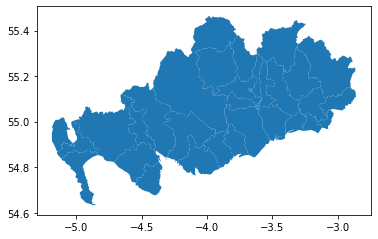

In [44]:
dum_proj.plot()

In this step, we use `mapclassify` to classify the data.

In [45]:
import mapclassify
import numpy as np

We first sort the GeoDataFrame `dum_proj` by the population density value.

In [46]:
dum_proj.sort_values(by="Persons per hectare",inplace=True)

Then we use `mapclassify` to perform say, a Quantile, classification to the value and get the legend classes. `mapclassify` supports lots of other data classification methods. Actually `geopandas` under the hood is built on `mapclassify`'s classification algorithm.

In [47]:
value = dum_proj["Persons per hectare"]

In [48]:
classes = mapclassify.Quantiles(value).get_legend_classes()
print(classes)

['[ 0.03,  0.13]', '( 0.13,  0.18]', '( 0.18,  0.38]', '( 0.38,  0.98]', '( 0.98, 34.48]']


Go back to the data and find the correct class bin.

In [49]:
index = mapclassify.Quantiles(value).find_bin(value)
print(index)

[0 0 0 0 0 0 0 1 1 1 1 1 1 1 2 2 2 2 2 2 3 3 3 3 3 3 3 4 4 4 4 4 4 4]


Create another column in the data and name it `classes`, and assign the corresponsing legend class.

In [50]:
dum_proj['classes'] = np.array(classes)[index]

In [51]:
dum_proj['classes'].head()

20    [ 0.03,  0.13]
33    [ 0.03,  0.13]
31    [ 0.03,  0.13]
9     [ 0.03,  0.13]
15    [ 0.03,  0.13]
Name: classes, dtype: object

Then we can start to make the map using `px.choropleth()` function. Detailed explanation of each parameter used is in the comments.

In [52]:
import plotly.express as px

fig = px.choropleth(dum_proj, #GeoDataFrame
                   geojson=dum_proj.geometry, #GeoDataFrame geometry
                   locations=dum_proj.index, #GeoDataFrame index
                   color="classes", #Use the classes cloumn as the color
                   hover_data = {"Persons per hectare": True}, #You can set which column to show when hover your mouse.
                   projection = "mercator", #Set the projection to mercator
                   title = "Choropleth Map", #Set title 
                   color_discrete_sequence= px.colors.sequential.Teal,#Find color: https://plotly.com/python/builtin-colorscales/
                   height=800 #Size of the plot
                   )

fig.update_geos(fitbounds="locations", visible=False) #Center the plot to the bounding box.

fig.show() #Show the plot

You can save the interactive map as an HTML file.

In [53]:
fig.write_html("plotly_map.html")